# Installation

In [ ]:
!pip install git+https://github.com/borongzhang/magpie_ptychography.git@main

# Imports

In [1]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
import h5py
from numpy.fft import fft2, ifft2, fftshift, ifftshift
import imageio.v2 as imageio
import random
import time
from magpie_ptychography.src import magpie_loop, rpie, lbfgs
from magpie_ptychography.src import feasibility_distance_misfit
from magpie_ptychography.src import generate_intensity_measurements, generate_scanning_positions


# Setup

In [2]:
# Size of the object
object_shape = (512, 512)

# Side length of the probe
n_probe = 128


## Realistic Synthetic Object and Probe

In [3]:
mat_data = scipy.io.loadmat('assets/recon_zoneplate_Yi.mat')
obj = mat_data['obj']
orgn_probe = mat_data['probe']

pad_x = (object_shape[0] - obj.shape[0]) // 2
pad_y = (object_shape[1] - obj.shape[1]) // 2

# Pad the object to the desired shape
real_object = np.pad(obj, ((pad_x, pad_x), (pad_y, pad_y)), mode='edge')

ratio = orgn_probe.shape[0] // n_probe

real_probe = orgn_probe[::ratio,::ratio]

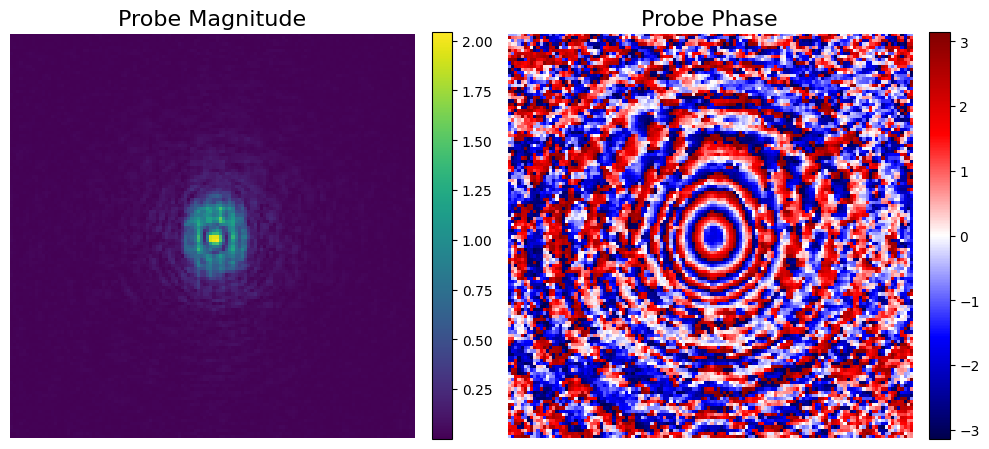

In [4]:
# Compute magnitude and phase
magnitude = np.abs(real_probe)
phase = np.angle(real_probe)

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

ax = axes[0]
im0 = ax.imshow(magnitude, cmap='viridis')
ax.set_title('Probe Magnitude', fontsize = 16)
ax.axis('off')
plt.colorbar(im0, ax=ax, fraction=0.046, pad=0.04)

ax = axes[1]
im1 = ax.imshow(phase, cmap='seismic')
ax.set_title('Probe Phase', fontsize = 16)
ax.axis('off')
plt.colorbar(im1, ax=ax, fraction=0.046, pad=0.04)

plt.tight_layout()
#plt.savefig('probe_mag_phase.png', dpi=120, bbox_inches='tight')
plt.show()

## Test Synthetic Object 

In [6]:
# Load the images
baboon_image = imageio.imread('assets/baboon.tiff')
# Convert the Baboon image to grayscale 
if baboon_image.ndim == 3:
    baboon_image = np.mean(baboon_image, axis=2)
    
cameraman_image = imageio.imread('assets/cameraman.tif')
if cameraman_image.ndim == 3:
    cameraman_image = np.mean(cameraman_image, axis=2)

# Normalize the Baboon image to [0, 1] for magnitude
baboon_magnitude = baboon_image / np.max(baboon_image)

# Normalize the Cameraman image to [0, pi/2] for phase
cameraman_phase = (cameraman_image / np.max(cameraman_image)) * (np.pi / 2)

synthetic_object = baboon_magnitude * np.exp(1j * cameraman_phase)


/var/folders/26/rw2jcprn5qv45z71fxbk4t2w0000gn/T/ipykernel_80607/3075504364.py:15: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  cameraman_phase = (cameraman_image / np.max(cameraman_image)) * (np.pi / 2)
/var/folders/26/rw2jcprn5qv45z71fxbk4t2w0000gn/T/ipykernel_80607/3075504364.py:17: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  synthetic_object = baboon_magnitude * np.exp(1j * cameraman_phase)


/var/folders/26/rw2jcprn5qv45z71fxbk4t2w0000gn/T/ipykernel_80607/1642947703.py:1: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  magnitude = np.abs(synthetic_object)


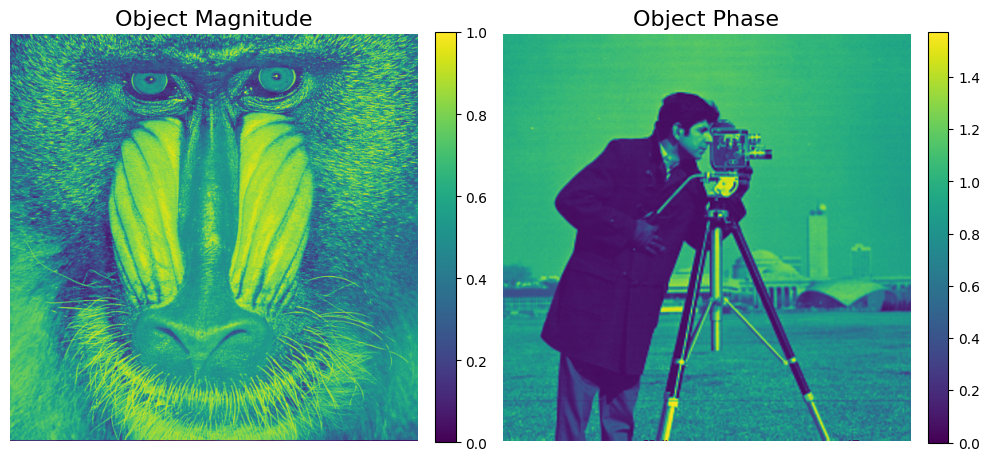

In [7]:
magnitude = np.abs(synthetic_object)
phase = np.angle(synthetic_object)

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

ax = axes[0]
im0 = ax.imshow(magnitude, cmap='viridis')
ax.set_title('Object Magnitude', fontsize = 16)
ax.axis('off')
plt.colorbar(im0, ax=ax, fraction=0.046, pad=0.04)

ax = axes[1]
im1 = ax.imshow(phase, cmap='viridis')
ax.set_title('Object Phase', fontsize = 16)
ax.axis('off')
plt.colorbar(im1, ax=ax, fraction=0.046, pad=0.04)

plt.tight_layout()
#plt.savefig('synthetic_object.png', dpi=120, bbox_inches='tight')
plt.show()


## Data Generation

In [14]:
# Choose Object
probe = real_probe
ground_truth = synthetic_object

# Probe shift for intensity measurement
shift = 64

# Define scanning positions
pos_array = generate_scanning_positions(object_shape, n_probe, shift)

# Generate the data
data_n05 = generate_intensity_measurements(ground_truth, probe, pos_array, 0.05)
data_n1 = generate_intensity_measurements(ground_truth, probe, pos_array, 0.1)
data_n2 = generate_intensity_measurements(ground_truth, probe, pos_array, 0.2)
data_n4 = generate_intensity_measurements(ground_truth, probe, pos_array, 0.4)


# Numerical examples

In [15]:
misfit = feasibility_distance_misfit
z_initial = np.ones_like(ground_truth)
num_iterations = 1000
alpha_rpie = 0.025
print('The maximum level for MAGPIE is:', int(np.log2(probe.shape[0])))


The maximum level for MAGPIE is: 7


In [16]:
s = time.time()
z_recon_rPIE_n05, res_rPIE_n05, errors_rPIE_n05 = rpie(z_initial, probe, data_n05, pos_array, 
                                                num_iterations, misfit, ground_truth,
                                                alpha = alpha_rpie, metric = True, tol = 1e-4)
print(time.time()-s)


Iteration: 0, f: 1649.4562563070979, g: 0.059524876591519005, error: 242.3473661616205
Iteration: 1, f: 128.29838439558895, g: 0.008205478425597292, error: 222.97280181631882
Iteration: 2, f: 63.122905290117046, g: 0.0030383230575638308, error: 217.00993046201617
Iteration: 3, f: 47.114947185377176, g: 0.0017860051219302565, error: 212.95521410626762
Iteration: 4, f: 39.19633763569901, g: 0.0012597145056370649, error: 209.68077631343147
Iteration: 5, f: 34.14008137765299, g: 0.0009864521870880751, error: 206.8662347024067
Iteration: 6, f: 30.498503039621124, g: 0.0008207787168498827, error: 204.36797595497046
Iteration: 7, f: 27.69575165787351, g: 0.0007097544715032134, error: 202.10677271709022
Iteration: 8, f: 25.44466811808915, g: 0.0006285154470871899, error: 200.0317274588586
Iteration: 9, f: 23.584183352993612, g: 0.0005680726407196034, error: 198.10831486710595
Iteration: 10, f: 22.01276556212485, g: 0.0005178842291784317, error: 196.3125611977983
Iteration: 11, f: 20.6628031387

Iteration: 92, f: 3.7843583336228863, g: 0.00011304778594434533, error: 142.8402801384858
Iteration: 93, f: 3.7462183708083874, g: 0.0001122234960401248, error: 142.52864077437832
Iteration: 94, f: 3.708867981602612, g: 0.00011175165951470315, error: 142.2201116472501
Iteration: 95, f: 3.672222272140097, g: 0.00011068126073718432, error: 141.91485386942927
Iteration: 96, f: 3.636341933843318, g: 0.00011068809773091099, error: 141.6125703129306
Iteration: 97, f: 3.6011276290275016, g: 0.00011089235662020583, error: 141.31325415010198
Iteration: 98, f: 3.5665259224916013, g: 0.0001096847583017383, error: 141.01699355819144
Iteration: 99, f: 3.5325817801852786, g: 0.00010846073822414342, error: 140.72352990003066
Iteration: 100, f: 3.4992881693491653, g: 0.00010798218547614696, error: 140.43278204822974
Iteration: 101, f: 3.466681359153663, g: 0.0001078823538477508, error: 140.14498022367826
Iteration: 102, f: 3.4346277306842055, g: 0.00010767436445595294, error: 139.85988178472513
Iterat

In [18]:
s = time.time()
z_recon_rPIE_n1, res_rPIE_n1, errors_rPIE_n1 = rpie(z_initial, probe, data_n1, pos_array, 
                                                num_iterations, misfit, ground_truth,
                                                alpha = alpha_rpie, metric = True, tol = 1e-4)
print(time.time()-s)

Iteration: 0, f: 1649.9489653909234, g: 0.059527609755612415, error: 242.3473661616205
Iteration: 1, f: 128.65969201502193, g: 0.00820688963052279, error: 222.97208467656918
Iteration: 2, f: 63.452889205997224, g: 0.0030383821458608504, error: 217.00753118994527
Iteration: 3, f: 47.4288416732537, g: 0.0017859443594803552, error: 212.95154194941315
Iteration: 4, f: 39.50291594098193, g: 0.0012604376935382328, error: 209.67608315459978
Iteration: 5, f: 34.43966634099306, g: 0.0009854324038315776, error: 206.86051427772256
Iteration: 6, f: 30.794148762662314, g: 0.0008216697647273699, error: 204.36142869219566
Iteration: 7, f: 27.98669056617665, g: 0.0007106783638275112, error: 202.09917166333634
Iteration: 8, f: 25.731625720339867, g: 0.0006302594185502697, error: 200.02279975276943
Iteration: 9, f: 23.866745476647473, g: 0.000566859158302106, error: 198.09869530894238
Iteration: 10, f: 22.29192624722759, g: 0.0005183477773360116, error: 196.30180094226202
Iteration: 11, f: 20.9391706177

Iteration: 92, f: 3.9799989750725664, g: 0.00011444468656480353, error: 142.91008188494388
Iteration: 93, f: 3.941528522715925, g: 0.00011380883344217926, error: 142.60027679731112
Iteration: 94, f: 3.9038342925264415, g: 0.00011405392540196682, error: 142.29364050998007
Iteration: 95, f: 3.8668073929097506, g: 0.00011351871599615687, error: 141.99012359290487
Iteration: 96, f: 3.830519766985944, g: 0.00011295269029575567, error: 141.68977852139554
Iteration: 97, f: 3.7948934844595947, g: 0.00011212201300569785, error: 141.39250138685819
Iteration: 98, f: 3.7600513756040748, g: 0.00011254062495547127, error: 141.09799090518197
Iteration: 99, f: 3.7257994685584923, g: 0.0001121564940317299, error: 140.80644049676695
Iteration: 100, f: 3.6921382366240465, g: 0.00011150292244919765, error: 140.517881178935
Iteration: 101, f: 3.6590622367098735, g: 0.00011027558855500459, error: 140.2319894272063
Iteration: 102, f: 3.6266959877565905, g: 0.00011027936867418694, error: 139.94876283299584
It

In [19]:
s = time.time()
z_recon_rPIE_n2, res_rPIE_n2, errors_rPIE_n2 = rpie(z_initial, probe, data_n2, pos_array, 
                                                num_iterations, misfit, ground_truth,
                                                alpha = alpha_rpie, metric = True, tol = 1e-4)
print(time.time()-s)

Iteration: 0, f: 1651.2972473745747, g: 0.05954480987491669, error: 242.3473661616205
Iteration: 1, f: 129.40584168236663, g: 0.008206021596345215, error: 222.96652304959386
Iteration: 2, f: 64.18555488771244, g: 0.0030383971397183276, error: 216.99756603675812
Iteration: 3, f: 48.1345353934843, g: 0.0017876574568507291, error: 212.9377245978712
Iteration: 4, f: 40.18450400529754, g: 0.0012613561701419428, error: 209.65832412387758
Iteration: 5, f: 35.10308274927629, g: 0.0009873882358285863, error: 206.8394050902233
Iteration: 6, f: 31.441195620042134, g: 0.0008231043110206854, error: 204.33750474418127
Iteration: 7, f: 28.620480460303504, g: 0.0007131804527244808, error: 202.07302982347557
Iteration: 8, f: 26.352835629080793, g: 0.0006314832011148463, error: 199.99481612816697
Iteration: 9, f: 24.477577555755396, g: 0.000570202625554088, error: 198.0688167221395
Iteration: 10, f: 22.893026473565037, g: 0.0005204831619250414, error: 196.2708720835741
Iteration: 11, f: 21.5313043536366

Iteration: 92, f: 4.383280496212593, g: 0.00012238711824966639, error: 143.11338816506913
Iteration: 93, f: 4.343995990604433, g: 0.00012091776878606539, error: 142.8080656297452
Iteration: 94, f: 4.305523958887722, g: 0.00012006676952828998, error: 142.50596615044202
Iteration: 95, f: 4.26783310316488, g: 0.00012022325026574898, error: 142.20703758006775
Iteration: 96, f: 4.230877031864253, g: 0.00011988252139624645, error: 141.91110476762705
Iteration: 97, f: 4.194612730938786, g: 0.0001195431995196657, error: 141.61818818837784
Iteration: 98, f: 4.159002269193619, g: 0.00011876942449449641, error: 141.32829859736788
Iteration: 99, f: 4.124004214648613, g: 0.00011796551581252414, error: 141.0414046833763
Iteration: 100, f: 4.089715881381466, g: 0.00011763561060589201, error: 140.75723959199036
Iteration: 101, f: 4.056006743510851, g: 0.0001166174843750608, error: 140.47593640686796
Iteration: 102, f: 4.022928441851539, g: 0.00011570866566024817, error: 140.1974507393135
Iteration: 10

In [17]:
s = time.time()
z_recon_rPIE_n4, res_rPIE_n4, errors_rPIE_n4 = rpie(z_initial, probe, data_n4, pos_array, 
                                                num_iterations, misfit, ground_truth,
                                                alpha = alpha_rpie, metric = True, tol = 1e-4)
print(time.time()-s)

Iteration: 0, f: 1654.1448067182694, g: 0.05957902800108054, error: 242.3473661616205
Iteration: 1, f: 130.96835332607614, g: 0.008211159450939112, error: 222.9569894268645
Iteration: 2, f: 65.63374278240212, g: 0.0030411426363811454, error: 216.98101582978683
Iteration: 3, f: 49.52093551395684, g: 0.0017873142380841383, error: 212.91443551615924
Iteration: 4, f: 41.53012061860179, g: 0.0012621700849942878, error: 209.63012531772662
Iteration: 5, f: 36.415331558017094, g: 0.0009892227985482196, error: 206.8074792490126
Iteration: 6, f: 32.72647792320925, g: 0.0008247972045593495, error: 204.30355487263648
Iteration: 7, f: 29.881660220128843, g: 0.0007150909182486815, error: 202.03687756938453
Iteration: 8, f: 27.592977145056867, g: 0.0006339921996373773, error: 199.95749153424677
Iteration: 9, f: 25.69797210845462, g: 0.000571692375127109, error: 198.0309216327148
Iteration: 10, f: 24.095536699787083, g: 0.0005233505242597718, error: 196.23276544937568
Iteration: 11, f: 22.717047725895

Iteration: 92, f: 5.202991634901992, g: 0.00013187021646497149, error: 143.62967242559677
Iteration: 93, f: 5.162036199394532, g: 0.00013097804664913767, error: 143.33395700977488
Iteration: 94, f: 5.121909459736214, g: 0.00013040124790539797, error: 143.04151239406679
Iteration: 95, f: 5.082543669666119, g: 0.00012993462078001063, error: 142.7522345500496
Iteration: 96, f: 5.043885856225038, g: 0.00012911568971314292, error: 142.46615692578766
Iteration: 97, f: 5.006091954346291, g: 0.00012902081041623944, error: 142.18304055441214
Iteration: 98, f: 4.968830116329649, g: 0.0001285891084931944, error: 141.90294930690334
Iteration: 99, f: 4.932367981865704, g: 0.00012828370481376058, error: 141.62580145738667
Iteration: 100, f: 4.8965717080586595, g: 0.0001281886793036591, error: 141.35140032043924
Iteration: 101, f: 4.861301826157002, g: 0.00012717332033785329, error: 141.07997116114043
Iteration: 102, f: 4.82675813774909, g: 0.00012674146269751147, error: 140.81139052230535
Iteration:

Iteration: 183, f: 3.2153246952394596, g: 0.00010412968576378174, error: 125.30747517377186
Iteration: 184, f: 3.2039046361079695, g: 0.00010478397003335495, error: 125.16920028711557
Iteration: 185, f: 3.1924949761803654, g: 0.00010383453277786945, error: 125.03180522149529
Iteration: 186, f: 3.1812731835796613, g: 0.000104023993584714, error: 124.89537846132565
Iteration: 187, f: 3.1700881221411046, g: 0.00010374642410219856, error: 124.75980322734617
Iteration: 188, f: 3.1590627721245093, g: 0.00010384395813401579, error: 124.6251741631939
Iteration: 189, f: 3.148105114219834, g: 0.00010320329801887681, error: 124.49148676121126
Iteration: 190, f: 3.1373082526648477, g: 0.00010278686002533994, error: 124.35858704550012
Iteration: 191, f: 3.126672629278421, g: 0.0001033736694692786, error: 124.22645601851514
Iteration: 192, f: 3.1159798025882037, g: 0.00010208252622489057, error: 124.09519860936652
Iteration: 193, f: 3.105558664052659, g: 0.00010291903499664438, error: 123.9648180976

In [20]:
s = time.time()
z_recon_MAGPIE_n05, res_MAGPIE_n05, errors_MAGPIE_n05 = magpie_loop(z_initial, probe, data_n05, pos_array, 
                                                   num_iterations, misfit, ground_truth,
                                                   alpha = alpha_rpie, metric = True, tol = 1e-4, 
                                                        max_level = int(np.log2(probe.shape[0])))
print(time.time()-s)


Iteration: 0, f: 1649.4562563070979, g: 0.059524876591519005, error: 242.3473661616205
Iteration: 1, f: 37.47158343699691, g: 0.003364360717770332, error: 177.94382984808604
Iteration: 2, f: 22.134947063736863, g: 0.001597409442778923, error: 164.8302388495249
Iteration: 3, f: 16.282305486099332, g: 0.0010581869986561574, error: 155.36339883163032
Iteration: 4, f: 12.981621508831573, g: 0.000814449024609641, error: 147.88545308486417
Iteration: 5, f: 10.795284449871763, g: 0.000658526487506927, error: 141.71674434811266
Iteration: 6, f: 9.236953877503112, g: 0.0005592421296732061, error: 136.47555200918214
Iteration: 7, f: 8.071207418422002, g: 0.0004984773481472531, error: 131.93717095008387
Iteration: 8, f: 7.15544179483577, g: 0.00043793976114684584, error: 127.9563882526834
Iteration: 9, f: 6.42847597258056, g: 0.00039449009102015815, error: 124.41413469991329
Iteration: 10, f: 5.833319789944554, g: 0.0003555395511738769, error: 121.2373148362265
Iteration: 11, f: 5.345076254438410

In [21]:
s = time.time()
z_recon_MAGPIE_n1, res_MAGPIE_n1, errors_MAGPIE_n1 = magpie_loop(z_initial, probe, data_n1, pos_array, 
                                                   num_iterations, misfit, ground_truth,
                                                   alpha = alpha_rpie, metric = True, tol = 1e-4, 
                                                        max_level = int(np.log2(probe.shape[0])))
print(time.time()-s)

Iteration: 0, f: 1649.9489653909234, g: 0.059527609755612415, error: 242.3473661616205
Iteration: 1, f: 37.72561961341315, g: 0.003344152097760533, error: 177.97307295026144
Iteration: 2, f: 22.448845414650727, g: 0.001588882475305498, error: 164.83957594349675
Iteration: 3, f: 16.581740342551534, g: 0.001058930801032055, error: 155.37599551423463
Iteration: 4, f: 13.270677181922443, g: 0.0008058845474284261, error: 147.89180221308823
Iteration: 5, f: 11.092972820871076, g: 0.0006713086013269741, error: 141.71248436249314
Iteration: 6, f: 9.51676991779509, g: 0.0005451892265250263, error: 136.48236372182706
Iteration: 7, f: 8.34840020524493, g: 0.0004958123469159794, error: 131.93871739871128
Iteration: 8, f: 7.432391420583752, g: 0.0004362558029780338, error: 127.95811550778814
Iteration: 9, f: 6.704983840602893, g: 0.0004088553213503713, error: 124.41204420667455
Iteration: 10, f: 6.1026252877492935, g: 0.00035830748921181714, error: 121.24033771535123
Iteration: 11, f: 5.60533552317

In [26]:
s = time.time()
z_recon_MAGPIE_n2, res_MAGPIE_n2, errors_MAGPIE_n2 = magpie_loop(z_initial, probe, data_n2, pos_array, 
                                                   num_iterations, misfit, ground_truth,
                                                   alpha = alpha_rpie, metric = True, tol = 1e-4, 
                                                        max_level = int(np.log2(probe.shape[0])))
print(time.time()-s)

Iteration: 0, f: 1651.2972473745747, g: 0.05954480987491669, error: 242.3473661616205
Iteration: 1, f: 38.27266315878603, g: 0.0032660491643786167, error: 178.00967474127918
Iteration: 2, f: 23.107657748228892, g: 0.0016121818217324437, error: 164.83561480140966
Iteration: 3, f: 17.211889478977604, g: 0.001060401686861824, error: 155.36516840216134
Iteration: 4, f: 13.878397875363701, g: 0.0008029198570351315, error: 147.8812614957761
Iteration: 5, f: 11.687907545807095, g: 0.0006729780087753905, error: 141.69179801270013
Iteration: 6, f: 10.104895829271095, g: 0.0005644903512669919, error: 136.44378341827775
Iteration: 7, f: 8.916712742196568, g: 0.0004939433633942219, error: 131.909838080946
Iteration: 8, f: 7.991287674966944, g: 0.0004414348909166988, error: 127.9200533718564
Iteration: 9, f: 7.250996665366482, g: 0.0003955022104839723, error: 124.37210300525612
Iteration: 10, f: 6.647606005143508, g: 0.0003584536116391481, error: 121.19195773150977
Iteration: 11, f: 6.1439091418013

In [22]:
s = time.time()
z_recon_MAGPIE_n4, res_MAGPIE_n4, errors_MAGPIE_n4 = magpie_loop(z_initial, probe, data_n4, pos_array, 
                                                   num_iterations, misfit, ground_truth,
                                                   alpha = alpha_rpie, metric = True, tol = 1e-4, 
                                                        max_level = int(np.log2(probe.shape[0])))
print(time.time()-s)

Iteration: 0, f: 1654.1448067182694, g: 0.05957902800108054, error: 242.3473661616205
Iteration: 1, f: 39.83591194614738, g: 0.0033337958662526916, error: 177.93318449923268
Iteration: 2, f: 24.424232988843002, g: 0.0016141365254540906, error: 164.75439921334632
Iteration: 3, f: 18.479511782561293, g: 0.0010750875923253604, error: 155.26932132197368
Iteration: 4, f: 15.12159868605422, g: 0.0008271269552444736, error: 147.78930064420695
Iteration: 5, f: 12.885070853251198, g: 0.0006646777268716381, error: 141.6115602510039
Iteration: 6, f: 11.284232326755046, g: 0.0005651086802997046, error: 136.37053081100865
Iteration: 7, f: 10.083173917877435, g: 0.0005031882848756517, error: 131.8312604704861
Iteration: 8, f: 9.142277758248056, g: 0.0004476299871652578, error: 127.85457501900744
Iteration: 9, f: 8.384526209930316, g: 0.0003960093892578094, error: 124.31994476917808
Iteration: 10, f: 7.7686638442224405, g: 0.00037043757061312955, error: 121.14790000980804
Iteration: 11, f: 7.25343454

Iteration: 93, f: 2.1342597392898517, g: 0.0001184887862300065, error: 62.407685933659785
Iteration: 94, f: 2.125130393578027, g: 0.00011856600470566301, error: 62.22212210462196
Iteration: 95, f: 2.115865726496247, g: 0.0001172011134930625, error: 62.04036073032317
Iteration: 96, f: 2.1068134401023775, g: 0.00011539661041957028, error: 61.862132113824174
Iteration: 97, f: 2.0984009563069024, g: 0.00011689326960155882, error: 61.686890342319096
Iteration: 98, f: 2.0898364013399373, g: 0.00011664143303647023, error: 61.51515043209135
Iteration: 99, f: 2.081307991643115, g: 0.00011461691576332142, error: 61.34710658584978
Iteration: 100, f: 2.0731514233686523, g: 0.00011539109727127505, error: 61.18205935136862
Iteration: 101, f: 2.0649413157887455, g: 0.0001141922688096473, error: 61.02061657248087
Iteration: 102, f: 2.0568622220967616, g: 0.00011343019317654958, error: 60.86195832682512
Iteration: 103, f: 2.0490773869209953, g: 0.00011268860061675649, error: 60.70611201439233
Iteration

In [28]:
s = time.time()
z_initial = np.ones_like(ground_truth)
zstar_n05, error_f_LBFGS_n05, eval_history_LBFGS_n05 = lbfgs(z_initial, probe, data_n05, pos_array, 
                                                   num_iterations, misfit, ground_truth, tol = 1e-4)
print(time.time()-s)

Iter 1, f = 783.4899718062325, g = 0.0457621489615586, Func Evals = 2, Error = 234.4993033271521
Iter 2, f = 289.95009988170654, g = 0.016262228571016335, Func Evals = 3, Error = 232.7648437700362
Iter 3, f = 187.51784971684125, g = 0.009015569443670997, Func Evals = 4, Error = 231.45346531052002
Iter 4, f = 136.65683216190791, g = 0.006955151287582012, Func Evals = 5, Error = 229.8514359542636
Iter 5, f = 100.04748375148027, g = 0.0060698073842258785, Func Evals = 6, Error = 227.36528413819224
Iter 6, f = 84.3274115411664, g = 0.004924761950792742, Func Evals = 7, Error = 225.57647750243717
Iter 7, f = 75.5819124896305, g = 0.0029968641601818458, Func Evals = 8, Error = 224.88709341322357
Iter 8, f = 65.52292786623194, g = 0.002637749278525631, Func Evals = 9, Error = 222.9984753158333
Iter 9, f = 58.43439743310764, g = 0.0028281144319513393, Func Evals = 10, Error = 221.0190937041818
Iter 10, f = 51.774370712903846, g = 0.002684445920616122, Func Evals = 11, Error = 218.6715695505365

Iter 81, f = 3.1595072390900643, g = 0.00021100849253139484, Func Evals = 83, Error = 134.06557010897035
Iter 82, f = 3.0942319071199336, g = 0.0002594525004572413, Func Evals = 84, Error = 133.31199278664653
Iter 83, f = 2.994296725474509, g = 0.0003139937948831362, Func Evals = 85, Error = 131.9853235359845
Iter 84, f = 2.978651662626948, g = 0.0004424051520397779, Func Evals = 86, Error = 131.00643188193436
Iter 85, f = 2.9254650726260887, g = 0.000205643784521583, Func Evals = 87, Error = 131.4073269491474
Iter 86, f = 2.898873920501508, g = 0.00016368157400575302, Func Evals = 88, Error = 131.35702990070664
Iter 87, f = 2.8342293738088324, g = 0.00022701925657529228, Func Evals = 89, Error = 130.63898827212296
Iter 88, f = 2.765692418941709, g = 0.00018398264722606011, Func Evals = 90, Error = 129.7940826010668
Iter 89, f = 2.719682062099644, g = 0.0002688841053960818, Func Evals = 91, Error = 128.9531768630725
Iter 90, f = 2.665817760972385, g = 0.00018346574071379909, Func Evals

In [24]:
s = time.time()
z_initial = np.ones_like(ground_truth)
zstar_n1, error_f_LBFGS_n1, eval_history_LBFGS_n1 = lbfgs(z_initial, probe, data_n1, pos_array, 
                                                   num_iterations, misfit, ground_truth, tol = 1e-4)
print(time.time()-s)

Iter 1, f = 784.1755533394452, g = 0.045773612887776816, Func Evals = 2, Error = 234.49910242549885
Iter 2, f = 290.476452890519, g = 0.016272331566547112, Func Evals = 3, Error = 232.76489707029413
Iter 3, f = 187.96608705415935, g = 0.009022516040513885, Func Evals = 4, Error = 231.45328233709398
Iter 4, f = 137.08647536657764, g = 0.006961611718303442, Func Evals = 5, Error = 229.8517653313993
Iter 5, f = 100.45561034933169, g = 0.006074990279984158, Func Evals = 6, Error = 227.36593824701197
Iter 6, f = 84.71129855154827, g = 0.0049155586543059866, Func Evals = 7, Error = 225.58163090271884
Iter 7, f = 75.96675826335068, g = 0.0030006685876055135, Func Evals = 8, Error = 224.89139167804154
Iter 8, f = 65.86332963174745, g = 0.0026409193049845006, Func Evals = 9, Error = 222.99464258311502
Iter 9, f = 58.77462514886166, g = 0.002846041348831997, Func Evals = 10, Error = 221.01069021834584
Iter 10, f = 52.1203908403667, g = 0.00264750111789734, Func Evals = 11, Error = 218.6920836027

Iter 81, f = 3.2934348416418806, g = 0.00022687231458417656, Func Evals = 83, Error = 132.7179809543025
Iter 82, f = 3.230009851952912, g = 0.00023040940007199883, Func Evals = 84, Error = 131.56614120842573
Iter 83, f = 3.180677001143857, g = 0.0003148891187589978, Func Evals = 85, Error = 130.7603717896083
Iter 84, f = 3.1224136866858756, g = 0.00018143141682135065, Func Evals = 86, Error = 130.94833292667377
Iter 85, f = 3.0807328234179785, g = 0.00017038924726760744, Func Evals = 87, Error = 130.45599209502132
Iter 86, f = 3.0186184837412045, g = 0.0003022547556761513, Func Evals = 88, Error = 129.34618447873797
Iter 87, f = 2.9710223041478745, g = 0.00027238118582346396, Func Evals = 89, Error = 128.98344261736003
Iter 88, f = 2.932461329464864, g = 0.00022230322464051114, Func Evals = 90, Error = 128.9698126589634
Iter 89, f = 2.8626534905498415, g = 0.0002185845010064174, Func Evals = 91, Error = 128.52537969242292
Iter 90, f = 2.8046900417457703, g = 0.0002949246303032276, Func

Iter 159, f = 1.3543301073597398, g = 0.00010883444987488375, Func Evals = 163, Error = 106.23162516824316
Iter 160, f = 1.340474064068093, g = 0.0001819864573835795, Func Evals = 164, Error = 105.87032737446332
Iter 161, f = 1.329187231052035, g = 0.00010449792791468834, Func Evals = 165, Error = 105.77428902522983
Iter 162, f = 1.3214391924695494, g = 9.434807226603946e-05, Func Evals = 166, Error = 105.6855625821646
Iter 163, f = 1.3105882426353443, g = 9.832338376652129e-05, Func Evals = 167, Error = 105.58436244184432
Iter 164, f = 1.296167469093807, g = 0.00010538641344330303, Func Evals = 168, Error = 105.37186995985512
Iter 165, f = 1.2864565679030775, g = 0.00013741530833434937, Func Evals = 169, Error = 105.26445852500045
Iter 166, f = 1.2784712729167689, g = 9.613263875753849e-05, Func Evals = 170, Error = 105.15939283507558
Iter 167, f = 1.2694737537624168, g = 8.348183863053754e-05, Func Evals = 171, Error = 104.98644716607137
Iter 168, f = 1.2624391405211262, g = 8.226816

In [25]:
s = time.time()
z_initial = np.ones_like(ground_truth)
zstar_n2, error_f_LBFGS_n2, eval_history_LBFGS_n2 = lbfgs(z_initial, probe, data_n2, pos_array, 
                                                   num_iterations, misfit, ground_truth, tol = 1e-4)
print(time.time()-s)

Iter 1, f = 785.5805062832159, g = 0.045802318693149, Func Evals = 2, Error = 234.49851263818675
Iter 2, f = 291.49430313501966, g = 0.01628500688989664, Func Evals = 3, Error = 232.76493568460484
Iter 3, f = 188.88213219273032, g = 0.009029186378386938, Func Evals = 4, Error = 231.45278081554736
Iter 4, f = 137.99368828451668, g = 0.006969330166850393, Func Evals = 5, Error = 229.85119651763674
Iter 5, f = 101.31994505080468, g = 0.006088110785396539, Func Evals = 6, Error = 227.36363508988103
Iter 6, f = 85.5462413130912, g = 0.004916425773617159, Func Evals = 7, Error = 225.58180795150733
Iter 7, f = 76.80631587677142, g = 0.0030093078247631347, Func Evals = 8, Error = 224.89284446604432
Iter 8, f = 66.64218502188191, g = 0.002643537322532252, Func Evals = 9, Error = 222.9887823698538
Iter 9, f = 59.537791211732205, g = 0.0028572775057285446, Func Evals = 10, Error = 220.99962583506556
Iter 10, f = 52.85997009348339, g = 0.002643822415475212, Func Evals = 11, Error = 218.68728622489

Iter 81, f = 3.7250705718305115, g = 0.0002120936642217803, Func Evals = 85, Error = 132.72235222762438
Iter 82, f = 3.6452718012137715, g = 0.0002727879171663082, Func Evals = 86, Error = 131.7489867593548
Iter 83, f = 3.6022900684697245, g = 0.000486913889041748, Func Evals = 87, Error = 130.76061624670763
Iter 84, f = 3.5101961093049794, g = 0.00019500158974731615, Func Evals = 88, Error = 130.83073718525375
Iter 85, f = 3.480736110960479, g = 0.00017976559505646767, Func Evals = 89, Error = 130.57973948383145
Iter 86, f = 3.384340914786513, g = 0.00019927653561595666, Func Evals = 90, Error = 129.46467790727309
Iter 87, f = 3.3683643825816967, g = 0.0005783484737463815, Func Evals = 92, Error = 128.94474144622617
Iter 88, f = 3.2769613572087373, g = 0.00023565410017020282, Func Evals = 93, Error = 128.76402936728954
Iter 89, f = 3.244897396344396, g = 0.00016732433483632278, Func Evals = 94, Error = 128.72711323808437
Iter 90, f = 3.203960559119157, g = 0.00016318467294256593, Func

Iter 159, f = 1.5492977961648569, g = 9.537697351425685e-05, Func Evals = 165, Error = 105.0002832100285
Iter 160, f = 1.5382497499866679, g = 0.00013490758764549477, Func Evals = 166, Error = 104.64596158793664
Iter 161, f = 1.5307925636893835, g = 8.8955359074901e-05, Func Evals = 167, Error = 104.57678040824611
Iter 162, f = 1.5255901761689536, g = 8.862134704090834e-05, Func Evals = 168, Error = 104.53229271762636
81.2558331489563


In [23]:
s = time.time()
z_initial = np.ones_like(ground_truth)
zstar_n4, error_f_LBFGS_n4, eval_history_LBFGS_n4 = lbfgs(z_initial, probe, data_n4, pos_array, 
                                                   num_iterations, misfit, ground_truth, tol = 1e-4)
print(time.time()-s)

Iter 1, f = 788.52810856968, g = 0.045868365005838796, Func Evals = 2, Error = 234.49771921312606
Iter 2, f = 293.59488160077836, g = 0.016320330324260668, Func Evals = 3, Error = 232.76545289693223
Iter 3, f = 190.80409347083977, g = 0.009052336555364358, Func Evals = 4, Error = 231.45369943296043
Iter 4, f = 139.85780549676784, g = 0.006993868763414015, Func Evals = 5, Error = 229.85329370552495
Iter 5, f = 103.10611963011239, g = 0.006126537825215428, Func Evals = 6, Error = 227.36359716620126
Iter 6, f = 87.26348211748224, g = 0.004890226948331, Func Evals = 7, Error = 225.59866523846878
Iter 7, f = 78.54491220142235, g = 0.0030309007133286, Func Evals = 8, Error = 224.918254937756
Iter 8, f = 68.25732362910259, g = 0.002650934688579928, Func Evals = 9, Error = 223.0077688111434
Iter 9, f = 61.14605902142937, g = 0.0028673907003995526, Func Evals = 10, Error = 221.00346011015452
Iter 10, f = 54.455861493129184, g = 0.00251123207375687, Func Evals = 11, Error = 218.77081911289167
It

Iter 81, f = 4.341311637459485, g = 0.00021868436317688426, Func Evals = 83, Error = 132.6064510615558
Iter 82, f = 4.26018367994254, g = 0.00026385446080814934, Func Evals = 84, Error = 131.5912775121057
Iter 83, f = 4.225189829902646, g = 0.0005011276420778626, Func Evals = 85, Error = 130.7131750491236
Iter 84, f = 4.137720033611526, g = 0.00019050296676788203, Func Evals = 86, Error = 130.9534808824729
Iter 85, f = 4.107463509010298, g = 0.00018623132499159882, Func Evals = 87, Error = 130.61777465184045
Iter 86, f = 4.02128063011785, g = 0.0003197072455117381, Func Evals = 88, Error = 129.22430757582683
Iter 87, f = 3.97897469186459, g = 0.0004128372455012072, Func Evals = 89, Error = 128.869595639733
Iter 88, f = 3.926660496952336, g = 0.00019511068529417703, Func Evals = 90, Error = 129.04941907176658
Iter 89, f = 3.899346282791478, g = 0.00016814790350150246, Func Evals = 91, Error = 129.0262693748667
Iter 90, f = 3.831461474078822, g = 0.00018421939136232406, Func Evals = 92, 

Iter 159, f = 2.1541919174455786, g = 8.525539759184069e-05, Func Evals = 164, Error = 110.00831722648755
Iter 160, f = 2.138867545652363, g = 0.00012372838054888397, Func Evals = 165, Error = 109.74944885978641
Iter 161, f = 2.1267164561248846, g = 0.00011049451672779116, Func Evals = 166, Error = 109.50675676124993
Iter 162, f = 2.1174536388037866, g = 0.0001110945025094672, Func Evals = 167, Error = 109.35551100718922
Iter 163, f = 2.103972124803984, g = 9.29111475944931e-05, Func Evals = 168, Error = 109.14058863651584
Iter 164, f = 2.093774633871655, g = 0.00012900320296640704, Func Evals = 169, Error = 109.01641505985755
Iter 165, f = 2.0831662533265383, g = 9.177393101591983e-05, Func Evals = 170, Error = 108.91564274148386
Iter 166, f = 2.076529780090522, g = 9.085931113780094e-05, Func Evals = 171, Error = 108.81617311629898
Iter 167, f = 2.0669010295154546, g = 0.00013263581810915622, Func Evals = 172, Error = 108.57292925387908
Iter 168, f = 2.0570914111679803, g = 0.0001084

In [29]:
res_f_LBFGS_n05 = eval_history_LBFGS_n05['f']
errors_LBFGS_n05 = eval_history_LBFGS_n05['error']
res_f_LBFGS_n1 = eval_history_LBFGS_n1['f']
errors_LBFGS_n1 = eval_history_LBFGS_n1['error']
res_f_LBFGS_n2 = eval_history_LBFGS_n2['f']
errors_LBFGS_n2 = eval_history_LBFGS_n2['error']
res_f_LBFGS_n4 = eval_history_LBFGS_n4['f']
errors_LBFGS_n4 = eval_history_LBFGS_n4['error']

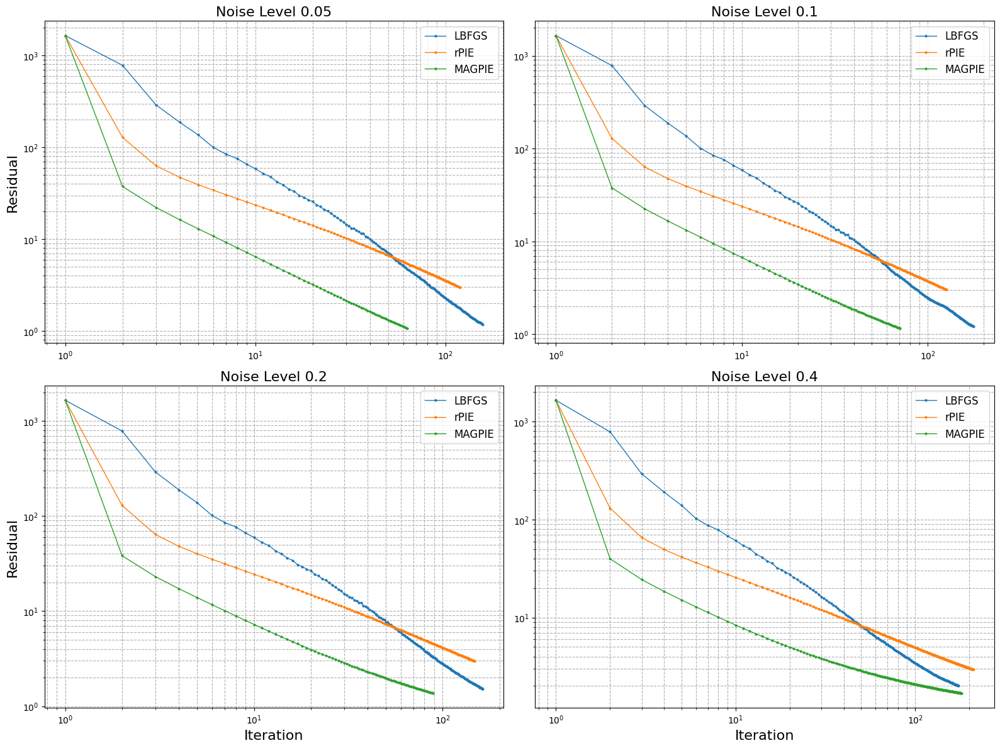

In [30]:
# Create a 2x2 grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 12))

# A helper function to plot one subfigure
def plot_subfigure(ax, res_lbfgs, res_rpie, res_mgrpie, noise_level, xlabel = True, ylabel = True):
    # Create x-values from 1 to the length of the residual arrays
    x_lbfgs = np.arange(1, len(res_lbfgs) + 1)
    x_rpie   = np.arange(1, len(res_rpie) + 1)
    x_mgrpie = np.arange(1, len(res_mgrpie) + 1)
    
    # Plot each method's residuals
    ax.plot(x_lbfgs, res_lbfgs, label='LBFGS', linestyle='-', marker='o', linewidth=1, markersize=2)
    ax.plot(x_rpie, res_rpie, label='rPIE', linestyle='-', marker='o', linewidth=1, markersize=2)
    ax.plot(x_mgrpie, res_mgrpie, label='MAGPIE', linestyle='-', marker='o', linewidth=1, markersize=2)
    
    # Set plot properties
    if xlabel:
        ax.set_xlabel('Iteration', fontsize=16)
    if ylabel:
        ax.set_ylabel('Residual', fontsize=16)
    ax.set_title(f'Noise Level {noise_level}', fontsize=16)
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.legend(fontsize=12)
    ax.grid(True, which="both", ls="--")

# Assign each subplot to the corresponding noise level
plot_subfigure(axes[0, 0], res_f_LBFGS_n05, res_rPIE_n05, res_MAGPIE_n05, noise_level=0.05, xlabel = False)
plot_subfigure(axes[0, 1], res_f_LBFGS_n1,  res_rPIE_n1,  res_MAGPIE_n1,  noise_level=0.1, xlabel = False, ylabel = False)
plot_subfigure(axes[1, 0], res_f_LBFGS_n2,  res_rPIE_n2,  res_MAGPIE_n2,  noise_level=0.2)
plot_subfigure(axes[1, 1], res_f_LBFGS_n4,  res_rPIE_n4,  res_MAGPIE_n4,  noise_level=0.4, ylabel = False)

plt.tight_layout()
#plt.savefig('residual_2.png', dpi=120, bbox_inches='tight')
plt.show()


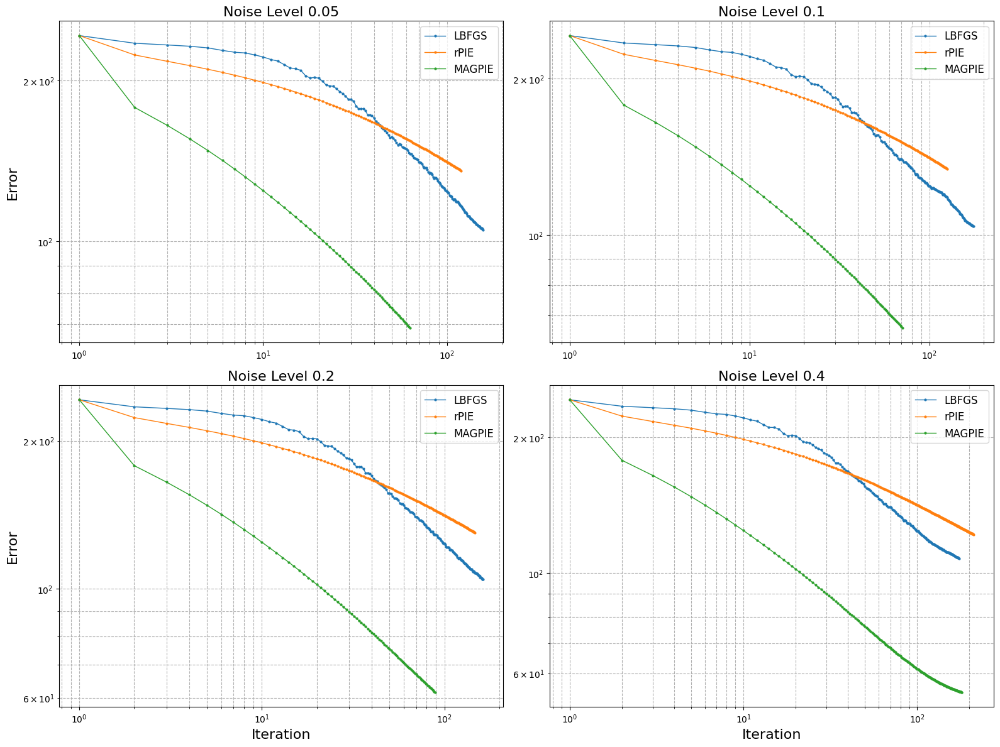

In [31]:
# Create a 2x2 grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 12))

# A helper function to plot one subfigure
def plot_subfigure(ax, res_lbfgs, res_rpie, res_mgrpie, noise_level, xlabel = True, ylabel = True):
    # Create x-values from 1 to the length of the residual arrays
    x_lbfgs = np.arange(1, len(res_lbfgs) + 1)
    x_rpie   = np.arange(1, len(res_rpie) + 1)
    x_mgrpie = np.arange(1, len(res_mgrpie) + 1)
    
    # Plot each method's residuals
    ax.plot(x_lbfgs, res_lbfgs, label='LBFGS', linestyle='-', marker='o', linewidth=1, markersize=2)
    ax.plot(x_rpie, res_rpie, label='rPIE', linestyle='-', marker='o', linewidth=1, markersize=2)
    ax.plot(x_mgrpie, res_mgrpie, label='MAGPIE', linestyle='-', marker='o', linewidth=1, markersize=2)
    
    # Set plot properties
    if xlabel:
        ax.set_xlabel('Iteration', fontsize=16)
    if ylabel:
        ax.set_ylabel('Error', fontsize=16)
    ax.set_title(f'Noise Level {noise_level}', fontsize=16)
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.legend(fontsize=12)
    ax.grid(True, which="both", ls="--")

# Assign each subplot to the corresponding noise level
plot_subfigure(axes[0, 0], errors_LBFGS_n05, errors_rPIE_n05, errors_MAGPIE_n05, noise_level=0.05, xlabel = False)
plot_subfigure(axes[0, 1], errors_LBFGS_n1,  errors_rPIE_n1,  errors_MAGPIE_n1,  noise_level=0.1, xlabel = False, ylabel = False)
plot_subfigure(axes[1, 0], errors_LBFGS_n2,  errors_rPIE_n2,  errors_MAGPIE_n2,  noise_level=0.2)
plot_subfigure(axes[1, 1], errors_LBFGS_n4,  errors_rPIE_n4,  errors_MAGPIE_n4,  noise_level=0.4, ylabel = False)

plt.tight_layout()
#plt.savefig('error_2.png', dpi=120, bbox_inches='tight')
plt.show()


/var/folders/26/rw2jcprn5qv45z71fxbk4t2w0000gn/T/ipykernel_80607/681213345.py:7: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  intensity_ground_truth = np.abs(ground_truth)
/var/folders/26/rw2jcprn5qv45z71fxbk4t2w0000gn/T/ipykernel_80607/681213345.py:15: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  intensity_LBFGS, phase_LBFGS = np.abs(LBFGS_image), np.angle(LBFGS_image)
/var/folders/26/rw2jcprn5qv45z71fxbk4t2w0000gn/T/ipykernel_80607/681213345.py:16: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  intensity_rPIE, phase_rPIE = np.abs(rPIE_image), np.angle(rPIE_image)
/var/folders/26/rw2jcprn5qv45z71fxbk4t2w0000gn/T/ipykernel_80607/681213345.py:17: DeprecationWarning: __array_wrap__ must accept context and return_sca

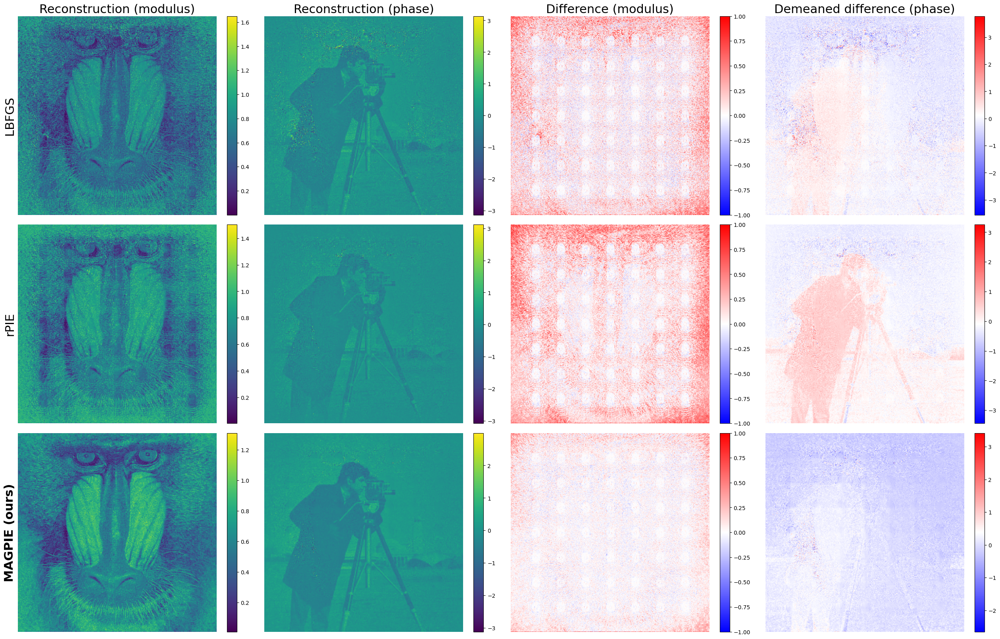

In [32]:
size = object_shape
rPIE_image = z_recon_rPIE_n4
MAGPIE_image = z_recon_MAGPIE_n4
LBFGS_image = zstar_n4.view(np.complex128).reshape(object_shape)
ground_truth = ground_truth

intensity_ground_truth = np.abs(ground_truth)
phase_ground_truth = np.angle(ground_truth)

def calculate_difference(image, ground_truth):
    intensity_diff = np.abs(image) - intensity_ground_truth
    phase_diff = np.angle(image) - phase_ground_truth - np.mean(np.angle(image) - phase_ground_truth)
    return intensity_diff, phase_diff

intensity_LBFGS, phase_LBFGS = np.abs(LBFGS_image), np.angle(LBFGS_image)
intensity_rPIE, phase_rPIE = np.abs(rPIE_image), np.angle(rPIE_image)
intensity_MAGPIE, phase_MAGPIE = np.abs(MAGPIE_image), np.angle(MAGPIE_image)

# Calculate differences
intensity_diff_LBFGS, phase_diff_LBFGS = calculate_difference(LBFGS_image, ground_truth)
intensity_diff_rPIE, phase_diff_rPIE = calculate_difference(rPIE_image, ground_truth)
intensity_diff_MAGPIE, phase_diff_MAGPIE = calculate_difference(MAGPIE_image, ground_truth)

# Updated column titles and row labels
column_titles = [
    "Reconstruction (modulus)", 
    "Reconstruction (phase)", 
    "Difference (modulus)", 
    "Demeaned difference (phase)"
]
row_labels = ["LBFGS", "rPIE", "MAGPIE (ours)"]

# Prepare data for plotting: each tuple contains (intensity, phase, intensity_diff, phase_diff)
image_data = [
    (intensity_LBFGS, phase_LBFGS, intensity_diff_LBFGS, phase_diff_LBFGS),
    (intensity_rPIE, phase_rPIE, intensity_diff_rPIE, phase_diff_rPIE),
    (intensity_MAGPIE, phase_MAGPIE, intensity_diff_MAGPIE, phase_diff_MAGPIE),
]

# Create a new figure using subplots 
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(25, 16), constrained_layout=True)

# Set column titles on the first row.
for j, title in enumerate(column_titles):
    axes[0, j].set_title(title, fontsize=22)

# Loop over each row of image data.
for i, (intensity, phase, intensity_diff, phase_diff) in enumerate(image_data):
    # Set the row label for the first column.
    if i == 2:
        axes[i, 0].set_ylabel(row_labels[i], fontsize=22, fontweight='bold')
    else:
        axes[i, 0].set_ylabel(row_labels[i], fontsize=22)

    # Remove spines and ticks for clarity.
    for j in range(4):
        ax = axes[i, j]
        for spine in ax.spines.values():
            spine.set_visible(False)
        ax.set_xticks([])
        ax.set_yticks([])

    # Plot the intensity image.
    im0 = axes[i, 0].imshow(intensity, cmap='viridis')
    fig.colorbar(im0, ax=axes[i, 0])

    # Plot the phase image.
    im1 = axes[i, 1].imshow(phase, cmap='viridis')
    fig.colorbar(im1, ax=axes[i, 1])
    
    # Plot the intensity difference image with symmetric scaling.
    max_intensity_diff = np.max(np.abs(intensity_diff))
    im2 = axes[i, 2].imshow(intensity_diff, cmap='bwr', vmin=-1, vmax=1)
    fig.colorbar(im2, ax=axes[i, 2])

    # Plot the phase difference image with symmetric scaling.
    max_phase_diff = np.max(np.abs(phase_diff))
    im3 = axes[i, 3].imshow(phase_diff, cmap='bwr')
    fig.colorbar(im3, ax=axes[i, 3])

#plt.savefig('reconstruction_2.png', dpi=60, bbox_inches='tight')
plt.show()